In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
from minisom import MiniSom
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings("ignore")
import math

In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math
from minisom import MiniSom
from sklearn.preprocessing import StandardScaler
import itertools

class SOMAnalyzer:
    def __init__(self, file1):
        self.file_path = file1
        self.cluster_infos = {}
        self.cluster_values_dfs = {}
        
    def filter_and_plot_weekly_averages(self):
        df = pd.read_csv(self.file_path)
        df_filtered = df[~df['Record_Year'].isin([2020, 2021])]
        #df_filtered = df_filtered[~((df_filtered['Record_Year'] == 2023) #& (df_filtered['Record_Week'] > 45))]
        df_filtered = df_filtered[~((df_filtered['Record_Week'] >  45))]
        return df_filtered

    def district_df(self, df_main, district_name):   
        
        df_c = df_main.loc[df_main['District'] == district_name]
        df_c = df_c[["2m_Temperature", "2m_Dewpoint_Temperature", "Total_Precipitation", "Case_Count"]]
        df_c = df_c.dropna()
        df_c = df_c.reset_index()
        df_c = df_c.drop("index", axis=1)
        return df_c

    def select_district(self,df_main):
        
        # Print the unique districts
        unique_districts = df_main['District'].unique()
        print("Available districts:", unique_districts)
        
        # Ask the user to type the district they want
        district_name = input("Please type the district you want: ")
        
        # Check if the entered district is in the list of unique districts
        if district_name in unique_districts:
            return district_name
        else:
            print("The district you typed is not in the list. Please try again.")
            return None
    
    def get_district_data(self, df_main):
        selected_district = self.select_district(df_main)
        if selected_district:
            district_data = self.district_df(df_main, selected_district)
        return district_data
    
    def get_district_data(self, df_main):
        selected_district = self.select_district(df_main)
        district_data = None  # Initialize district_data to None
        if selected_district:
            district_data = self.district_df(df_main, selected_district)
        return district_data

       
    def pop_mean(self,df):
        df['Case_Count'] = df['Case_Count'] / (df['Population'] / 1000000)
        return df
    

    def create_lag_df(self,lag_period, df):
        lagged_df = df.copy()
        # Columns to lag excluding ADD and MALARIA
        columns_to_lag = [col for col in df.columns if col not in ['Case_Count']]

        # Apply lag for each column and update the original DataFrame
        for column in columns_to_lag:
            lagged_df[column] = df[column].shift(-lag_period)

        # Drop rows with NaN values introduced by the lag
        lagged_df.dropna(inplace=True)
        lagged_df.reset_index(drop=True, inplace=True)
        lagged_df = lagged_df[["2m_Temperature","2m_Dewpoint_Temperature","Total_Precipitation","Case_Count"]]
        scaler = StandardScaler()
        standardized_data = scaler.fit_transform(lagged_df)
        return lagged_df, standardized_data
    
    def train_som(self,scaled_features, noc, sigma, learning_rate, iterations):
        som_shape = (noc, noc)
        som = MiniSom(som_shape[0], som_shape[1], scaled_features.shape[1], sigma=sigma, learning_rate=learning_rate,
                      neighborhood_function='gaussian', random_seed=10)
        som.random_weights_init(scaled_features)

        max_iter = iterations
        q_error = []
        t_error = []

        for i in range(max_iter):
            rand_i = np.random.randint(len(scaled_features))
            som.update(scaled_features[rand_i], som.winner(scaled_features[rand_i]), i, max_iter)
            q_error.append(som.quantization_error(scaled_features))
            t_error.append(som.topographic_error(scaled_features))

        plt.plot(np.arange(len(q_error)), q_error, label='quantization error')
        plt.plot(np.arange(len(t_error)), t_error, label='topographic error')
        plt.ylabel('Error')
        plt.xlabel('Iteration index')
        plt.legend()
        plt.show()

        return som

    def get_cluster_info(self,trained_som, scaled_features):
        cluster_info = {}
        for i, x in enumerate(scaled_features):
            winner = trained_som.winner(x)
            winner_str = str(winner)
            if winner_str in cluster_info:
                cluster_info[winner_str]['indices'].append(i)
            else:
                cluster_info[winner_str] = {'indices': [i]}
        return cluster_info
    
    def calculate_statistics(self,cluster_info, df_c):
        cluster_values_df = pd.DataFrame()
        for cluster, info in cluster_info.items():
            case_counts = df_c.loc[info['indices'], 'Case_Count'].mean()
            temperatures = df_c.loc[info['indices'], '2m_Temperature'].mean()
            dewpoints = df_c.loc[info['indices'], '2m_Dewpoint_Temperature'].mean()
            precipitation = df_c.loc[info['indices'], 'Total_Precipitation'].mean()
            cluster_values_df = cluster_values_df.append({

                'Case Count': case_counts,
                'Temperature': temperatures,
                'Dewpoint T': dewpoints,
                'Precipitation': precipitation
            }, ignore_index=True)
    
        return cluster_values_df
    
        
    def plot_statistics(self,cluster_values_df):
        fig, axs = plt.subplots(2, 2, figsize=(15, 10))
        cluster_values_df['Case Count'].plot(kind='bar', ax=axs[0, 0], color='skyblue')
        axs[0, 0].set_title('Average Case Count')
        cluster_values_df['Temperature'].plot(kind='bar', ax=axs[0, 1], color='orange')
        axs[0, 1].set_title('Average Temperature')
        cluster_values_df['Dewpoint T'].plot(kind='bar', ax=axs[1, 0], color='green')
        axs[1, 0].set_title('Average Dewpoint Temperature')
        cluster_values_df['Precipitation'].plot(kind='bar', ax=axs[1, 1], color='blue')
        axs[1, 1].set_title('Total Precipitation')
        plt.tight_layout()
        plt.show()

    def analyze_clusters(self,trained_som, scaled_features):
        cluster_info = self.get_cluster_info(trained_som, scaled_features)

        plt.figure(figsize=(15, 5))
        cluster_labels = [f'Cluster {i+1}' for i in range(len(cluster_info))]
        plt.subplot(1, 2, 1)
        clusters = list(cluster_info.keys())
        counts = [len(info['indices']) for info in cluster_info.values()]
        bars = plt.bar(range(len(clusters)), counts, color='skyblue')
        plt.xticks(range(len(clusters)), cluster_labels, rotation='vertical')
        plt.xlabel('Cluster')
        plt.ylabel('Number of Data Points')
        plt.title('Number of Data Points in Each Cluster')

        for bar, count in zip(bars, counts):
            y_pos = bar.get_height()
            plt.text(bar.get_x() + bar.get_width() / 2, y_pos, str(count), ha='center', va='bottom')

        plt.tight_layout()
        plt.show()

    def train_and_analyze_soms(self,noc,district_df,sf1, sf2, sf4,train_som, get_cluster_info, calculate_statistics,sigma,learning_rate,iterations):
    
        scaled_feature_sets = {
        'sf1': sf1,
        'sf2': sf2,
        'sf4': sf4
    }
        # Dictionary to store the trained SOMs
        trained_soms = {}

        # Dictionary to store the cluster information
        cluster_infos = {}

        # Dictionary to store the cluster values dataframes
        cluster_values_dfs = {}

        # Loop over each scaled feature set
        for key, sf in scaled_feature_sets.items():
            # Train the SOM for the current scaled feature set

            trained_som = train_som(sf, noc,sigma,learning_rate,iterations)
            trained_som.train_batch(sf, iterations, verbose=True)

            # Store the trained SOM
            trained_soms[key] = trained_som

            # Get the cluster information for the current trained SOM
            cluster_info = get_cluster_info(trained_som, sf)

            self.analyze_clusters(trained_som, sf)
            # Store the cluster information
            self.cluster_infos[key] = cluster_info

            # Calculate statistics for the current cluster information
            cluster_values_df = calculate_statistics(cluster_info, district_df)

            # Store the cluster values dataframe
            self.cluster_values_dfs[key] = cluster_values_df


            self.plot_statistics(cluster_values_df)
        return cluster_values_dfs



    def plot_variables(self,df1, df2, df4, noc):
        grid_size = math.ceil(math.sqrt(len(df1)))

        variables = ['ADD', 'MALARIA', 'WMMAX', 'WMMIN', 'WTRF']  # Replace with actual variable names

        # Define the labels for the bars
        labels = ['W1', 'W2', 'W4']

        # Define the bar width (uniform for all bars)
        bar_width = 0.25

        color_map = {
            'ADD': 'black',
            'MALARIA': 'black',
            'WMMAX': 'red',
            'WMMIN': 'blue',
            'WTRF': 'black'
        }

        # Loop over each variable to create a separate grid of subplots
        for variable in variables:
            # Create a figure with subplots arranged in a grid
            fig, axs = plt.subplots(noc, noc, figsize=(noc+2, noc+2), constrained_layout=True)
            axs = axs.flatten()


            for i, ax in enumerate(axs):
                # For 'ADD' and 'MALARIA', plot only the first value and round to the nearest integer
                if variable in ['ADD', 'MALARIA']:
                    values = [int(round(df1[variable].iloc[i]))]
                    current_labels = ['W1']
                else:
                    # For other variables, plot all values
                    values = [
                        df1[variable].iloc[i],
                        df2[variable].iloc[i],
                        df4[variable].iloc[i]
                    ]
                    current_labels = labels

                # Plot the bars with uniform width
                ax.bar(current_labels, values, width=bar_width, color=color_map[variable])

                ax.set_ylabel(variable)

                # Find the global maximum value for the current variable
                max_value = max(df1[variable].max(), df2[variable].max(), df4[variable].max())

                if not np.isnan(max_value) and np.isfinite(max_value):  # Set the same y-axis limit for all subplots
                    ax.set_ylim(0, max_value + (max_value * 0.1))

                # If variable is 'ADD' or 'MALARIA', display integer values
                if variable in ['ADD', 'MALARIA']:
                    for j, v in enumerate(values):
                        # Adjust label position to avoid overlapping bars
                        y_pos = v + (max_value * 0.05) if v > 0 else v - (max_value * 0.05)
                        ax.text(j, y_pos, str(int(v)), ha='center', va='bottom', fontsize=8)  # Show integer value as string

            # Adjust the layout and show the plot for the current variable
            plt.suptitle(f'{noc}x{noc} Grid of Subplots for {variable}')
            plt.show()
            
    def plot_variables(self,df1, df2, df4):
        grid_size = math.ceil(math.sqrt(len(df1)))

        variables = ['Case Count', 'Temperature', 'Dewpoint T', 'Precipitation']  # Replace with actual variable names

        # Define the labels for the bars
        labels = ['W1', 'W2', 'W4']

        # Define the bar width
        bar_width = 0.25

        color_map = {
            'Case Count': 'red',
            'Temperature': 'blue',
            'Dewpoint T': 'green',
            'Precipitation': 'black'
        }

        # Loop over each variable to create a separate 3x3 grid
        for variable in variables:
            # Find the global maximum value across all data points and dataframes for the current variable
            max_value = max(df1[variable].max(), df2[variable].max(), df4[variable].max())

            # Create a figure with a 3x3 grid of subplots for the current variable
            fig, axs = plt.subplots(grid_size, grid_size, figsize=(5, 5), constrained_layout=True)

            # Flatten the array of axes for easy iteration
            axs = axs.flatten()

            # Loop over each of the 9 data points, using the minimum length among the dataframes
            min_length = min(len(df1), len(df2), len(df4))
            for i in range(min_length):
                # Extract the i-th value of the variable from each dataframe
                if variable in ['Case Count']:
                    values = [int(round(df1[variable].iloc[i]))]
                    current_labels = ['W1']
                else:
                    values = [
                        df1[variable].iloc[i],
                        df2[variable].iloc[i],
                        df4[variable].iloc[i]
                    ]
                    current_labels = labels

                # Plot the bars in the i-th subplot with reduced width
                axs[i].bar(current_labels, values, width=bar_width, color=color_map[variable])

                # Set the title and labels for the subplot
                # axs[i].set_title(f'{variable} - Data Point {i+1}')
                # axs[i].set_xlabel('Week')
                axs[i].set_ylabel(variable)

                # Set the same y-axis limit for all subplots
                axs[i].set_ylim(0, max_value + (max_value * 0.1))  # Add 10% headroom for better visualization

                if variable in ['Case Count']:
                    for j, v in enumerate(values):
                        # Adjust label position to avoid overlapping bars
                        y_pos = v + (max_value * 0.05) if v > 0 else v - (max_value * 0.05)
                        axs[i].text(j, y_pos, str(int(v)), ha='center', va='bottom', fontsize=8)

            plt.show()




    def plots(self, df, noc, iterations, learning_rate, sigma):
        # Renamed variable to avoid conflict
        w1, sf1 = self.create_lag_df(0, df)
        w2, sf2 = self.create_lag_df(2, df)
        w4, sf4 = self.create_lag_df(4, df)

        # Assuming train_and_analyze_soms and plot_variables are defined elsewhere
        cluster_values_dfs = self.train_and_analyze_soms(noc, df, sf1, sf2, sf4, self.train_som,
                                                         self.get_cluster_info, self.calculate_statistics,
                                                         sigma, learning_rate, iterations)
        df1 = self.cluster_values_dfs['sf1']
        df2 = self.cluster_values_dfs['sf2']
        df4 = self.cluster_values_dfs['sf4']
        self.plot_variables(df1, df2, df4)
        
    def execute_steps(self, hyp):
        # Filter and plot weekly averages
        df = self.filter_and_plot_weekly_averages()

        # Population mean normalization
        df_norm = self.pop_mean(df)

        # Get district data
        district = self.get_district_data(df_norm)

        # Train and analyze SOMs
        for i in range(5):
            self.plots(district, 3, hyp[i][0], hyp[i][1], hyp[i][2])


Available districts: ['BAGALKOTE' 'BALLARI' 'BELAGAVI' 'BENGALURU RURAL' 'BENGALURU URBAN'
 'BIDAR' 'CHAMARAJANAGARA' 'CHIKKABALLAPURA' 'CHIKKAMAGALURU'
 'CHITRADURGA' 'DAKSHINA KANNADA' 'DAVANGERE' 'DHARWAD' 'GADAG' 'HASSAN'
 'HAVERI' 'KALABURAGI' 'KODAGU' 'KOLAR' 'KOPPAL' 'MANDYA' 'MYSURU'
 'RAICHUR' 'RAMANAGARA' 'SHIVAMOGGA' 'TUMAKURU' 'UDUPI' 'UTTARA KANNADA'
 'VIJAYANAGAR' 'VIJAYAPURA' 'YADGIR']
Please type the district you want: UDUPI


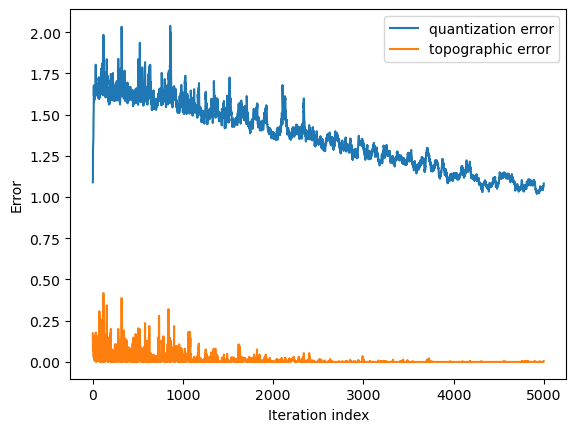

 [ 5000 / 5000 ] 100% - 0:00:00 left 
 quantization error: 1.0517162711019516


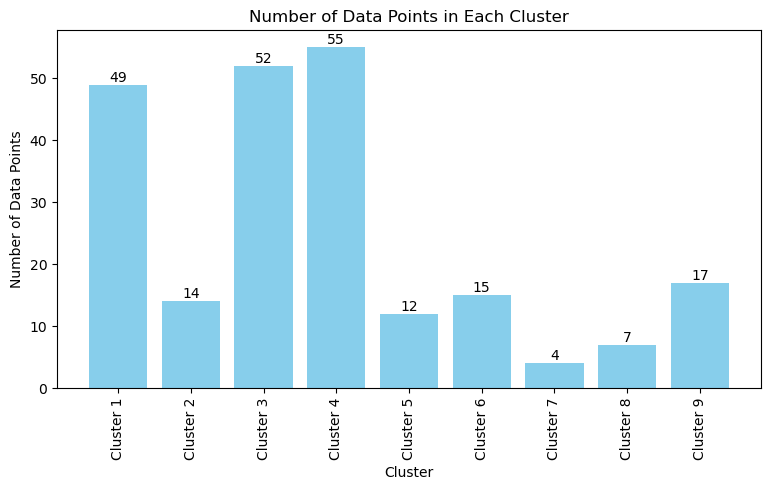

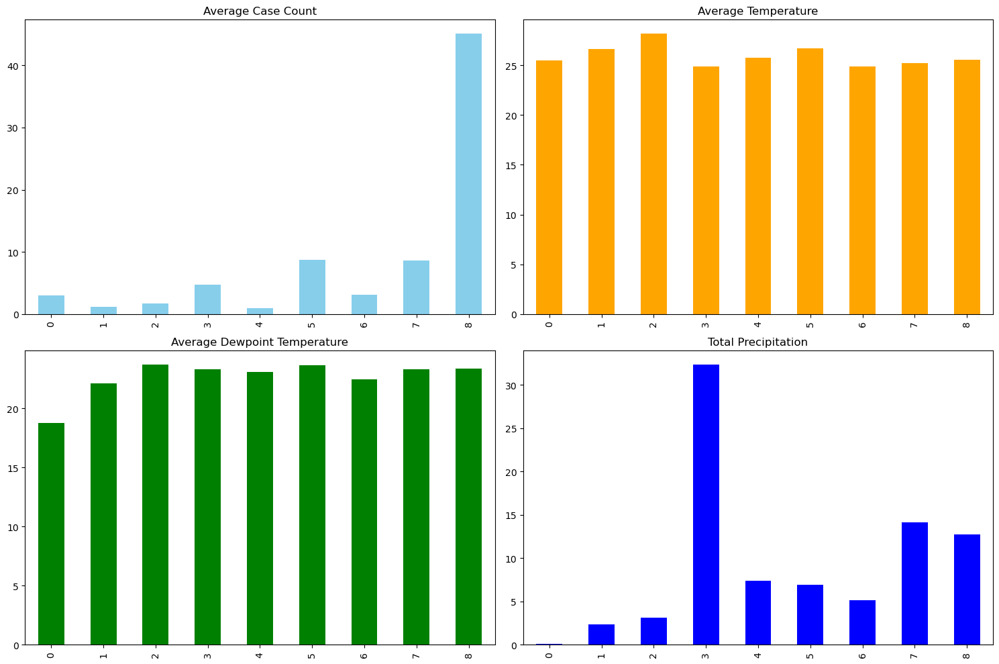

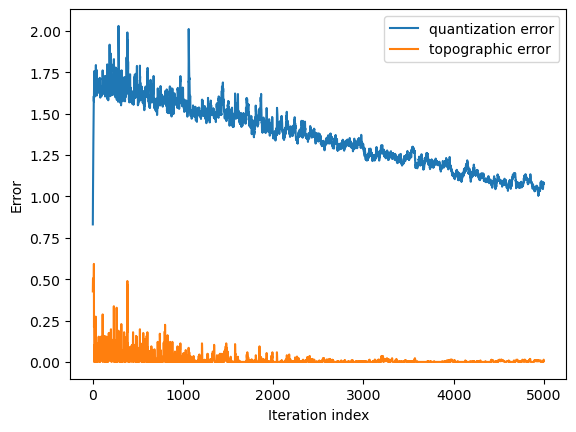

 [ 5000 / 5000 ] 100% - 0:00:00 left 
 quantization error: 1.0694947810766318


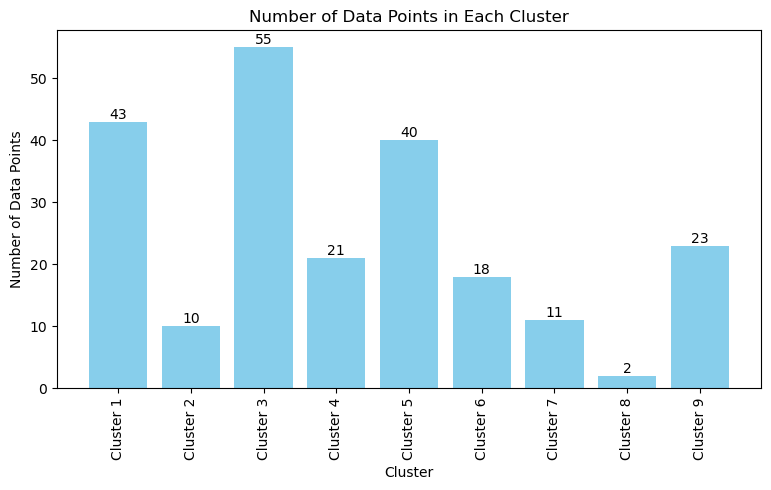

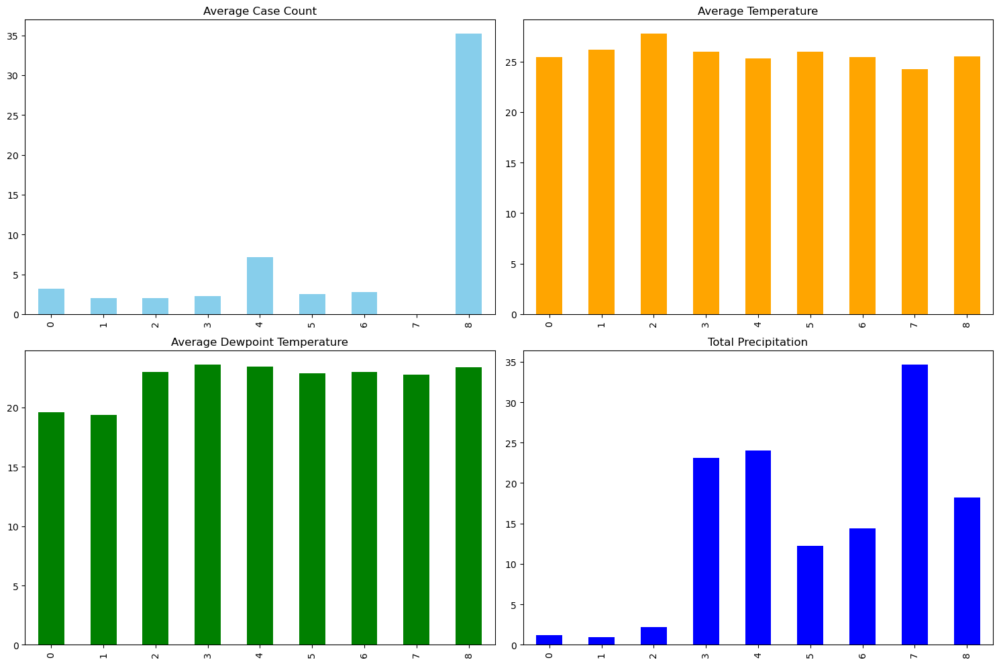

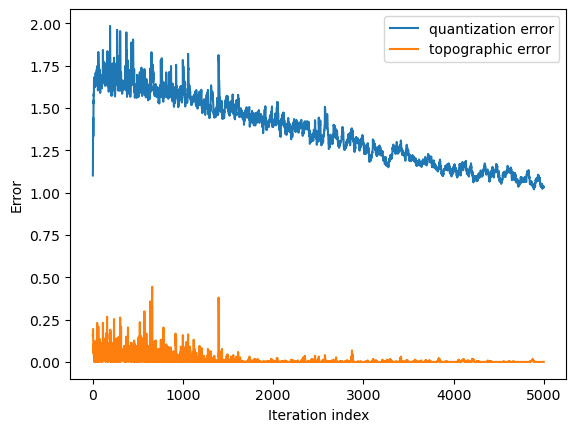

 [ 5000 / 5000 ] 100% - 0:00:00 left 
 quantization error: 1.029521902693658


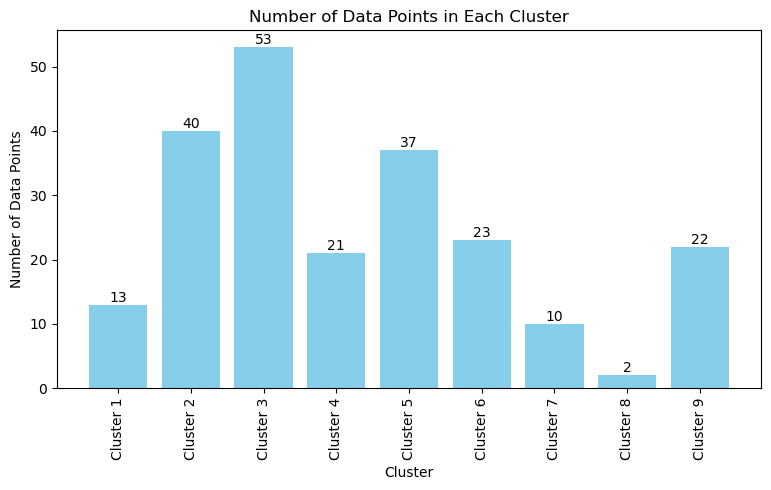

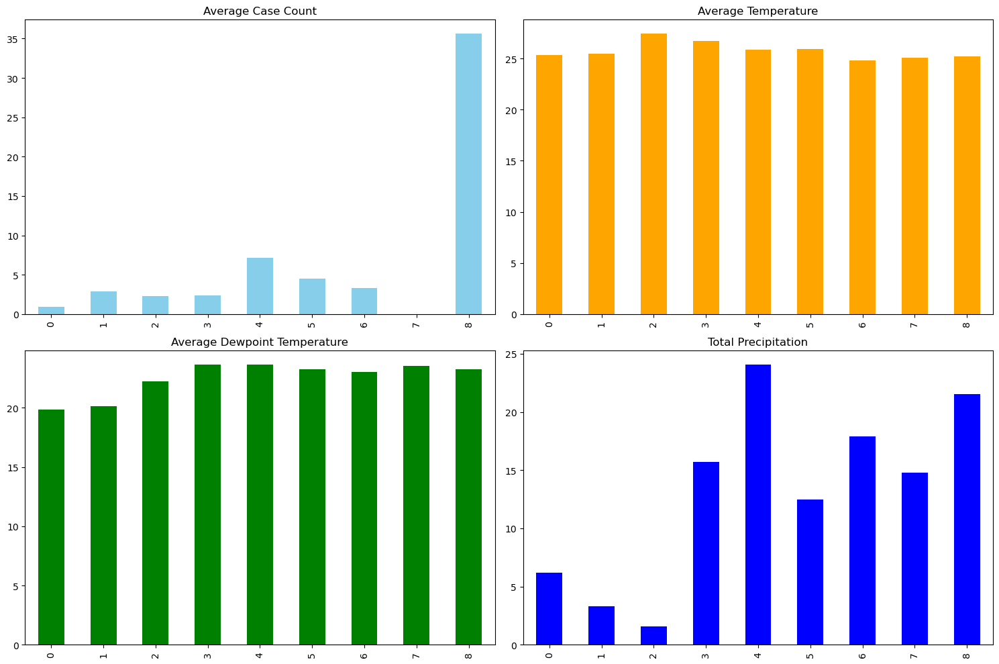

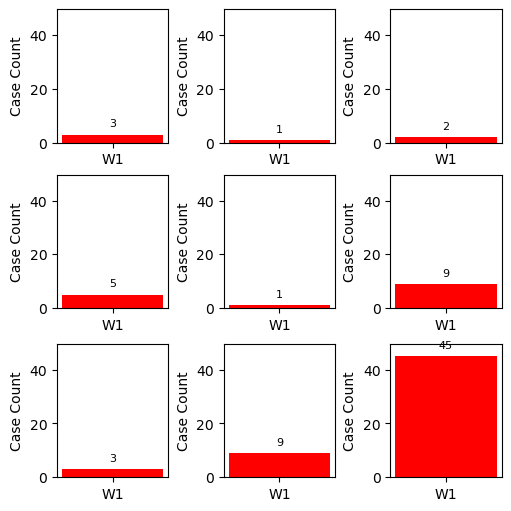

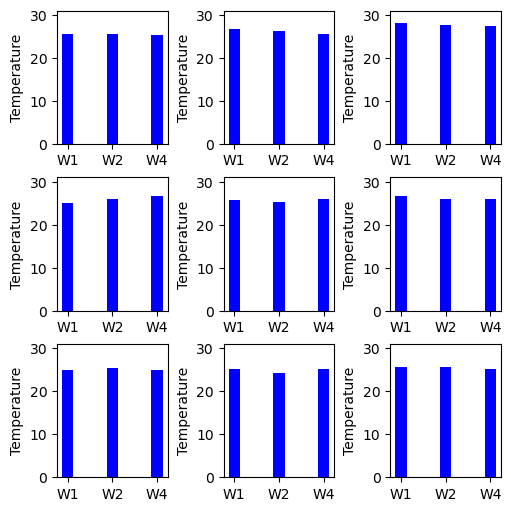

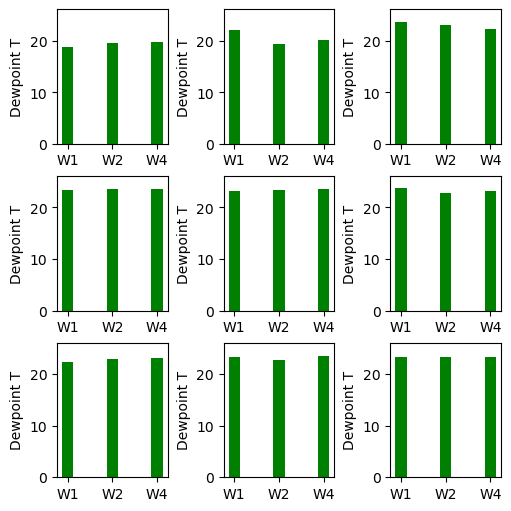

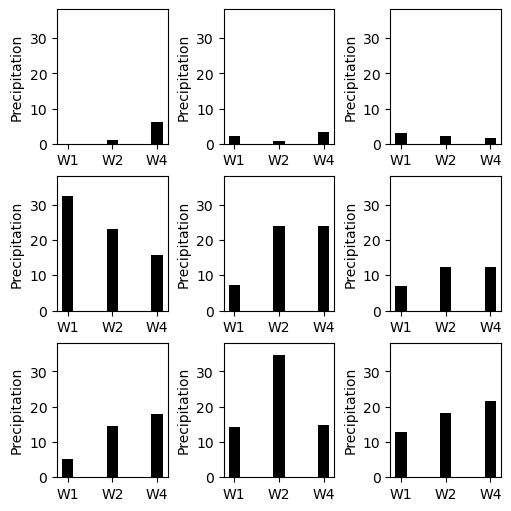

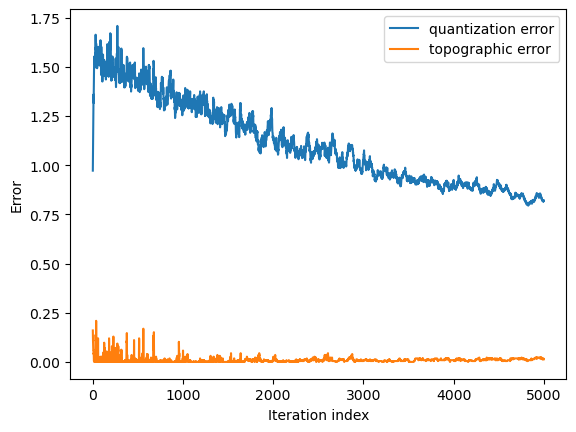

 [ 5000 / 5000 ] 100% - 0:00:00 left 
 quantization error: 0.8337013354243916


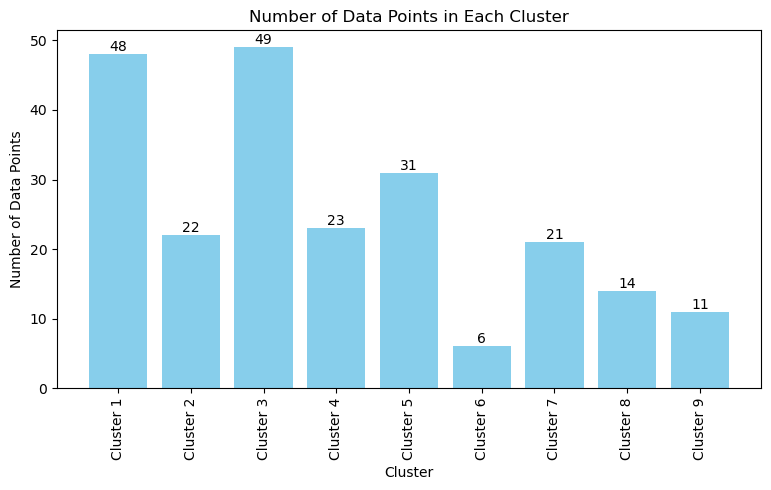

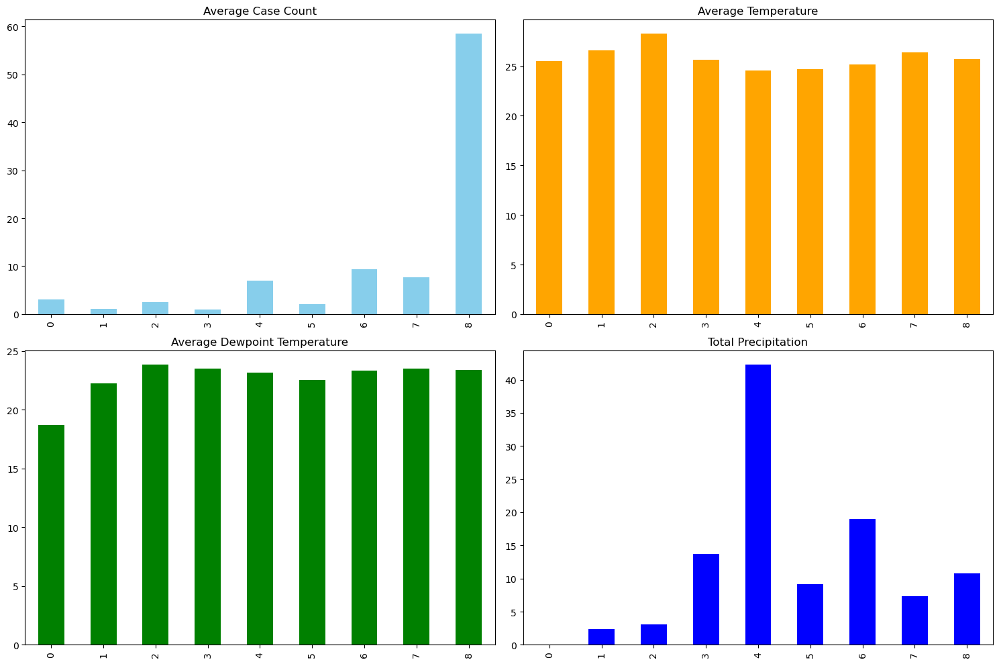

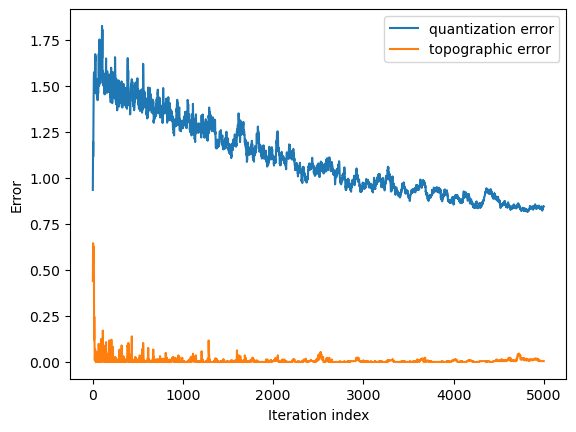

 [ 5000 / 5000 ] 100% - 0:00:00 left 
 quantization error: 0.8512730735308807


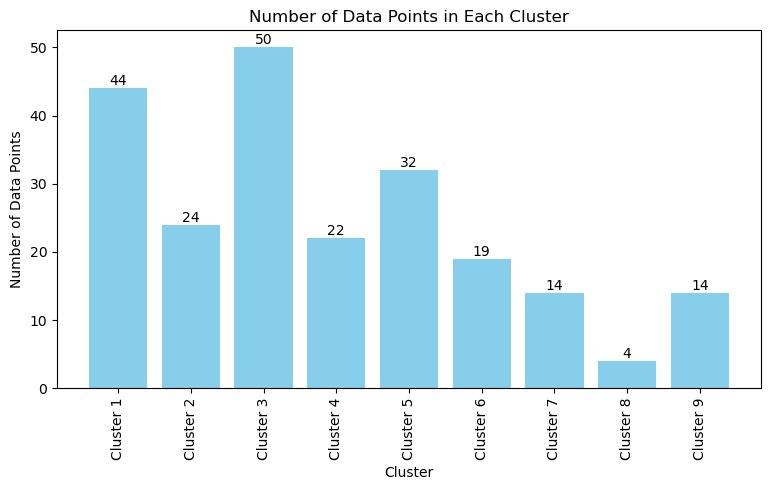

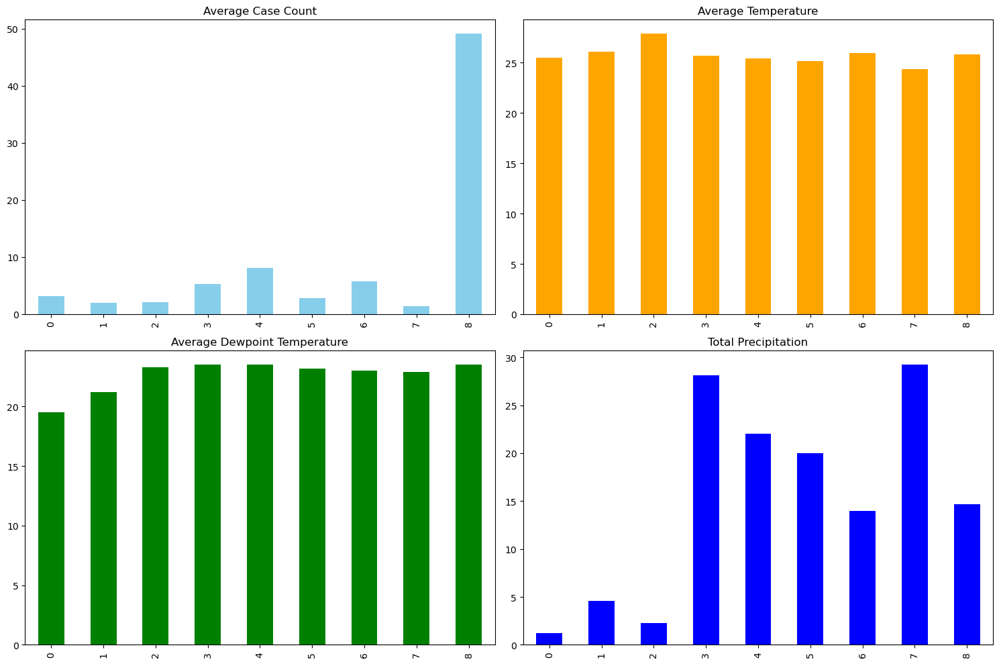

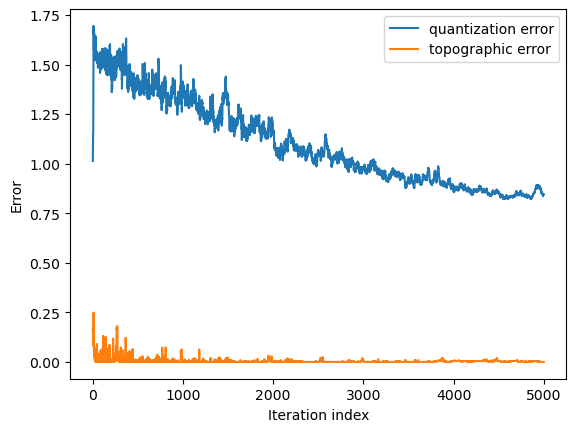

 [ 5000 / 5000 ] 100% - 0:00:00 left 
 quantization error: 0.8248306742001545


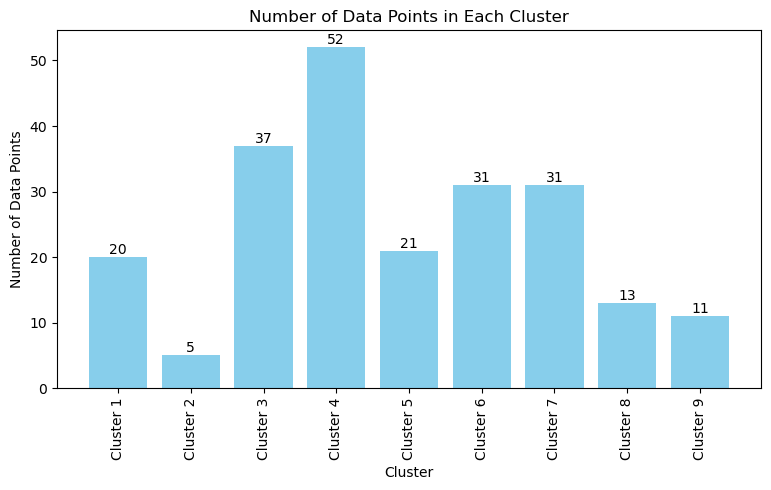

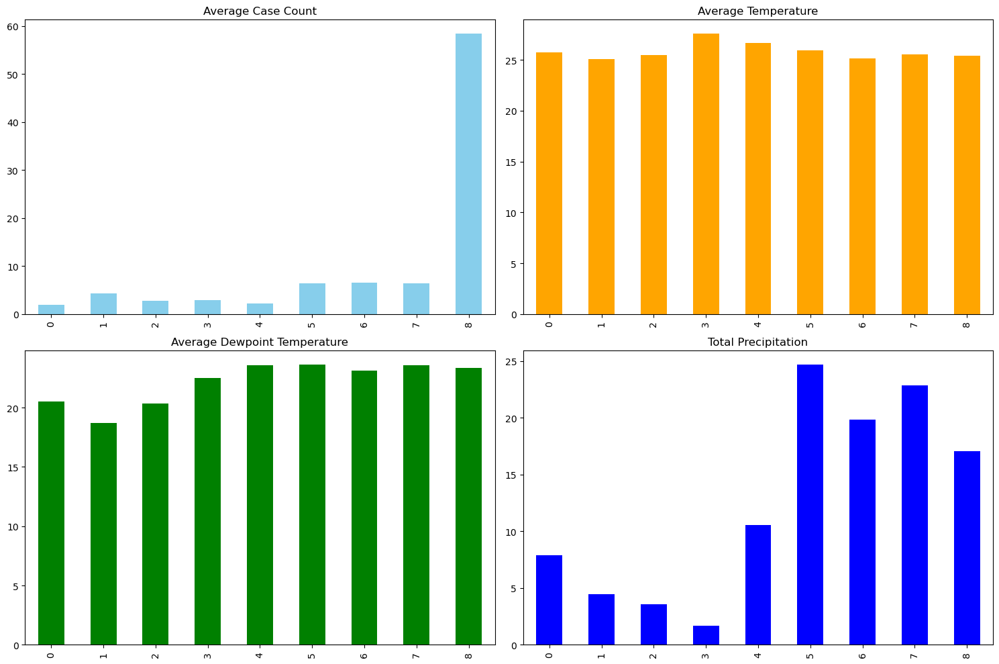

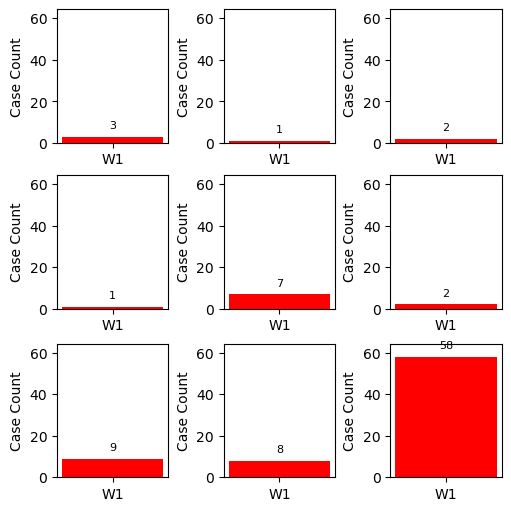

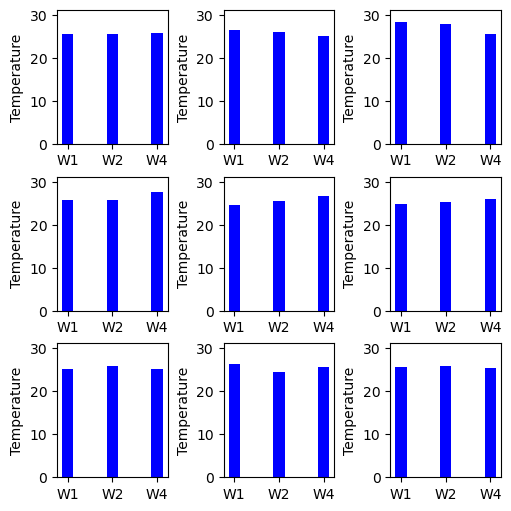

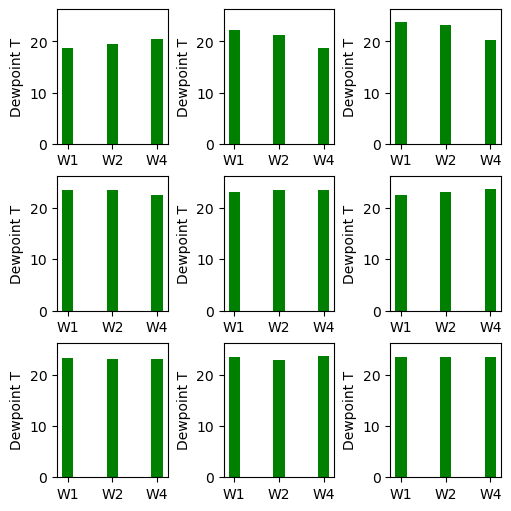

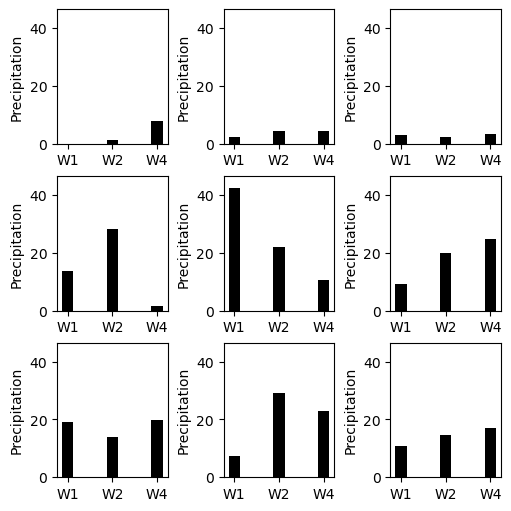

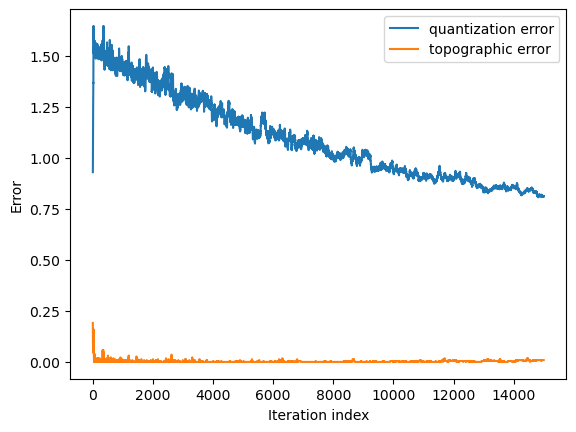

 [ 14945 / 15000 ] 100% - 0:00:00 left 

 [ 15000 / 15000 ] 100% - 0:00:00 left 
 quantization error: 0.8335871278033197


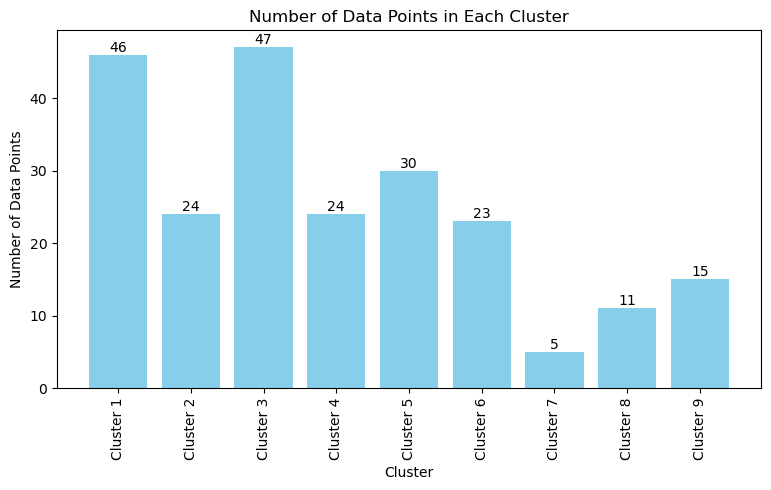

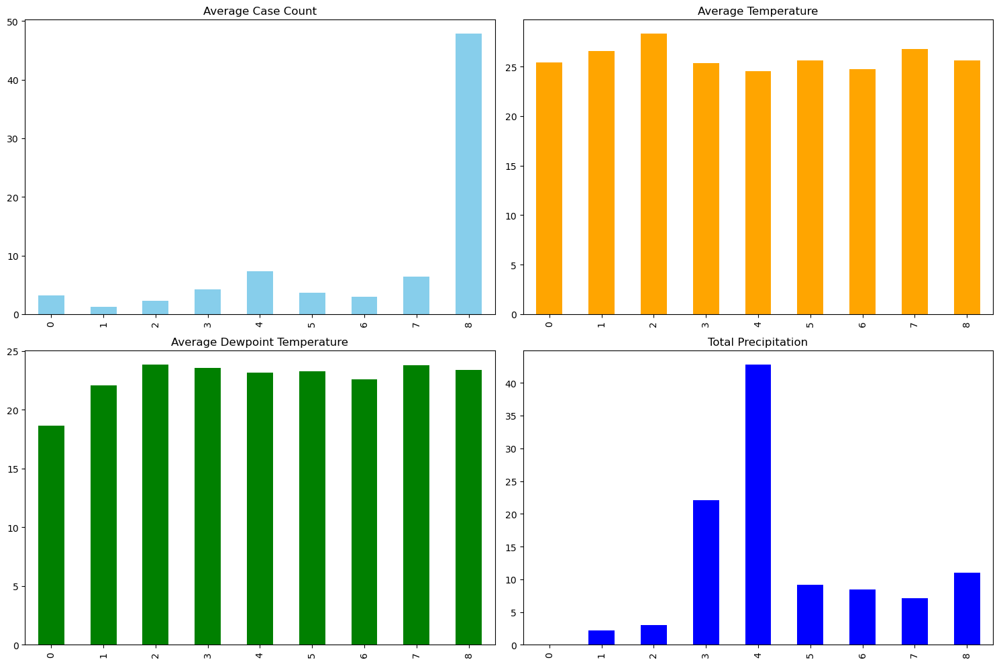

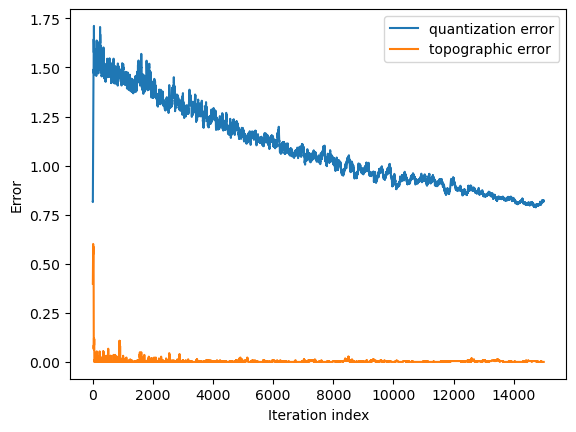

 [ 15000 / 15000 ] 100% - 0:00:00 left 
 quantization error: 0.8218807543536814


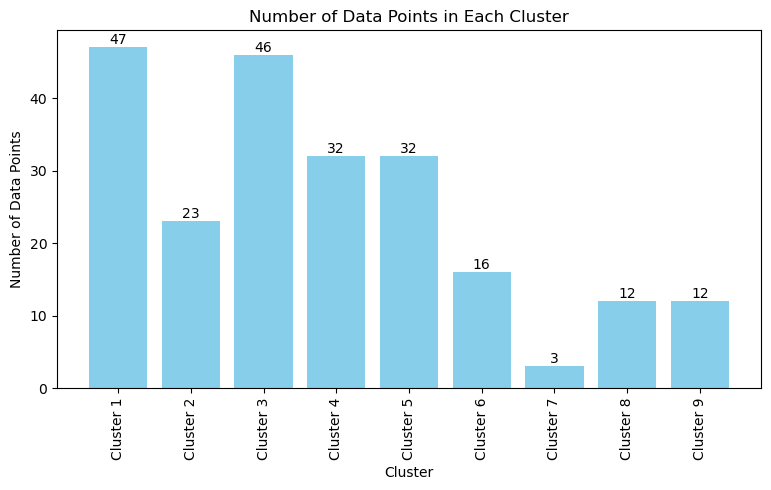

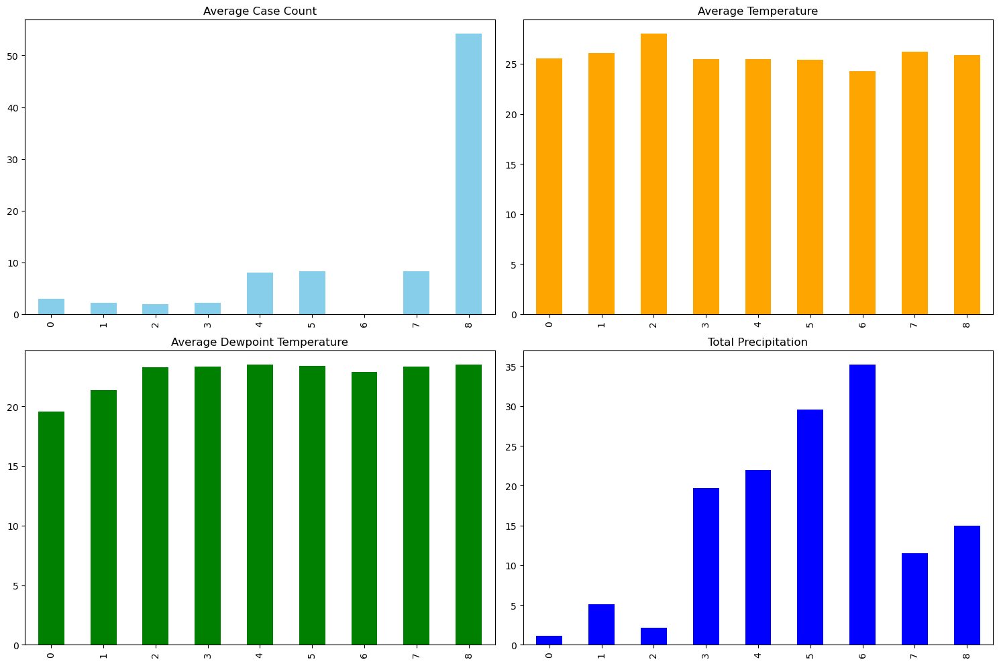

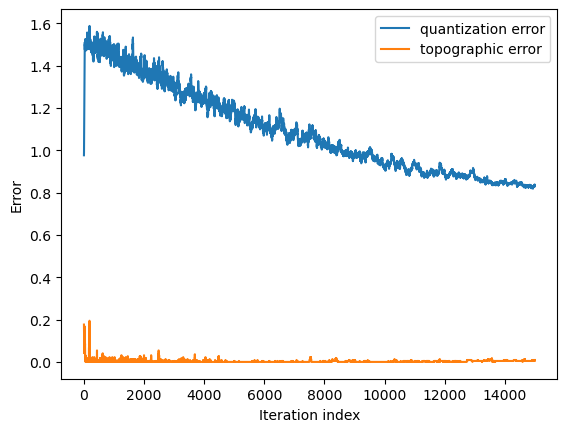

 [ 15000 / 15000 ] 100% - 0:00:00 left 
 quantization error: 0.8470183463896903


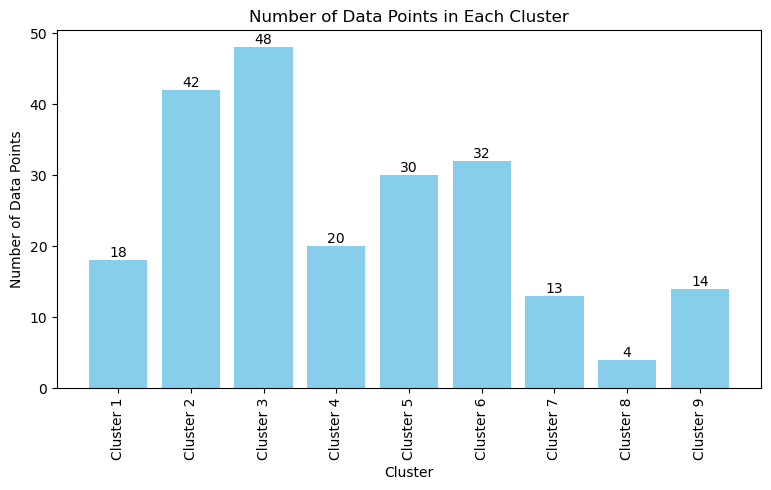

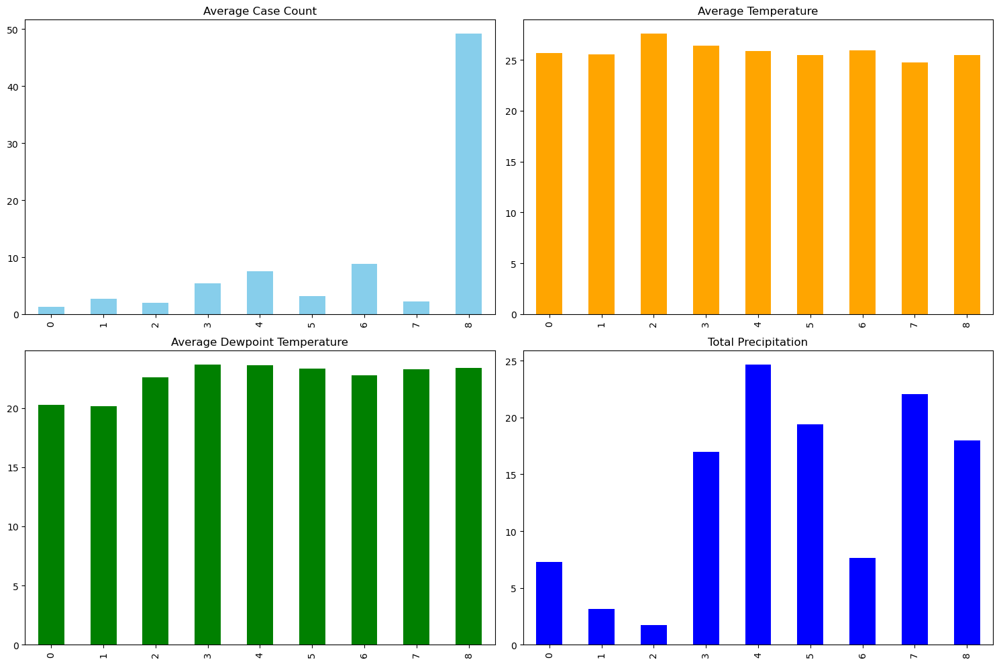

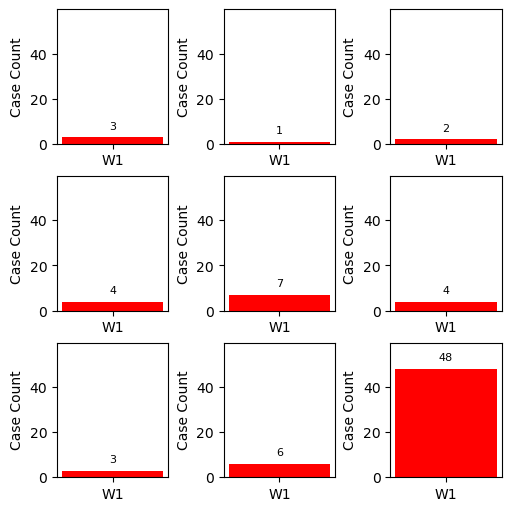

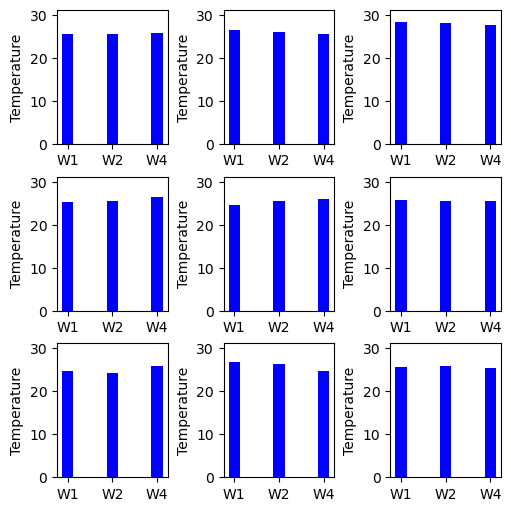

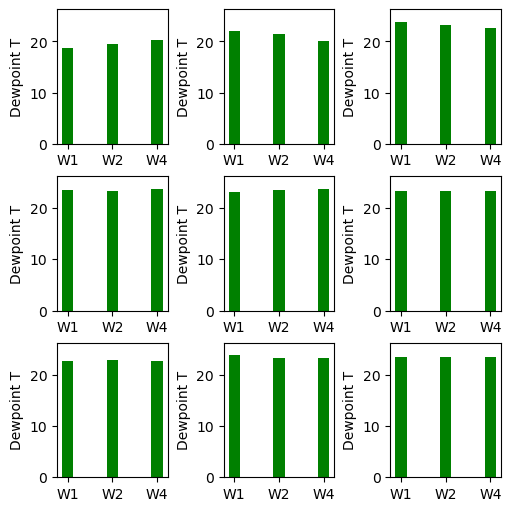

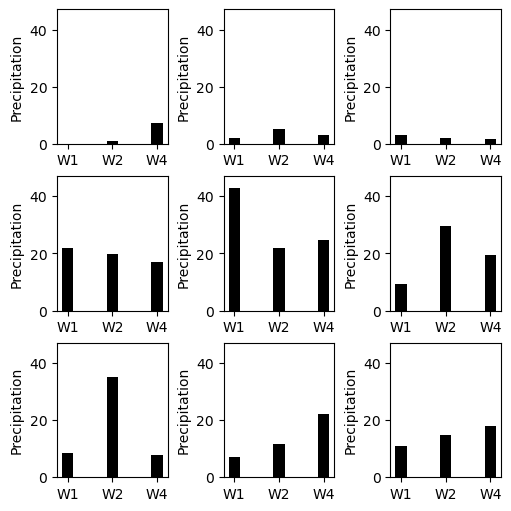

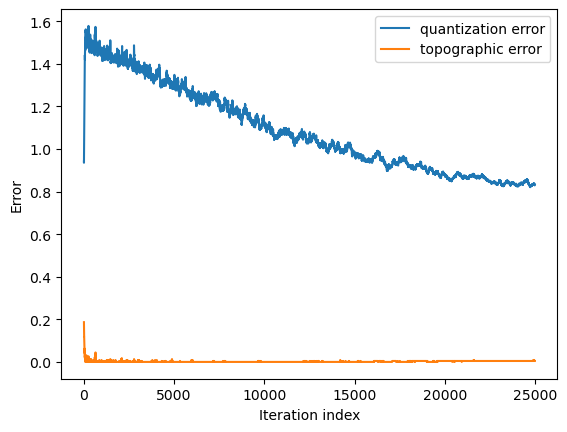

 [ 13573 / 25000 ]  54% - 0:00:00 left 

 [ 25000 / 25000 ] 100% - 0:00:00 left 
 quantization error: 0.8266752515018192


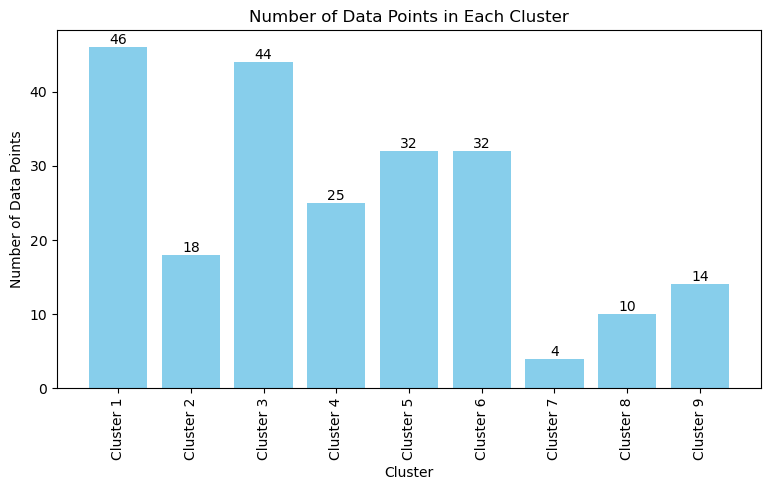

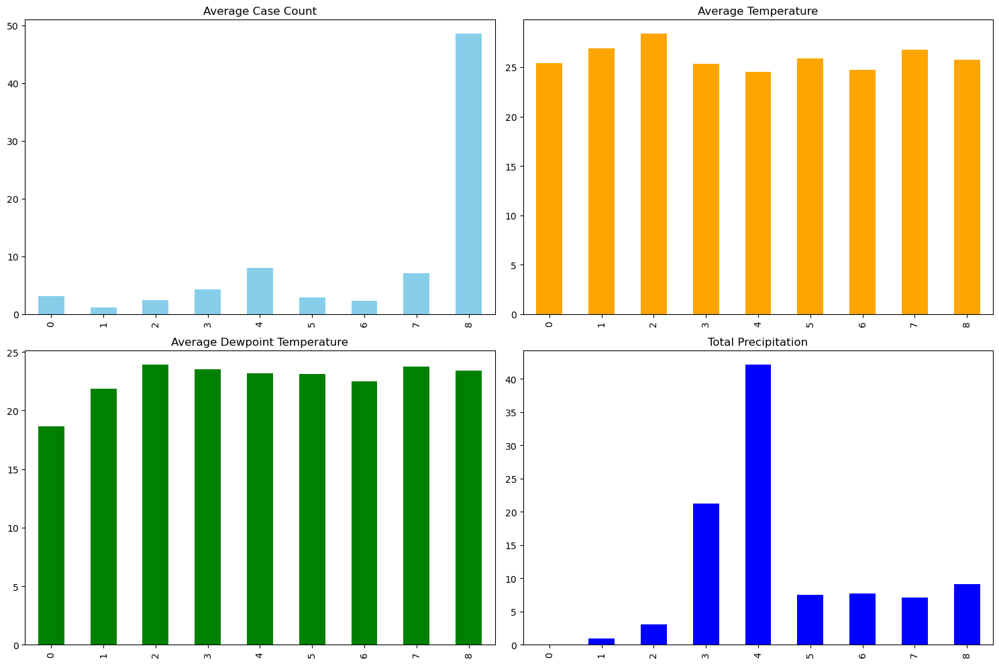

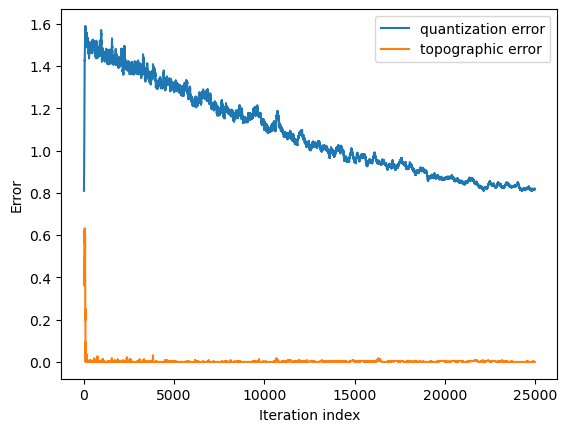

 [ 13884 / 25000 ]  56% - 0:00:00 left 

 [ 25000 / 25000 ] 100% - 0:00:00 left 
 quantization error: 0.8151544485672712


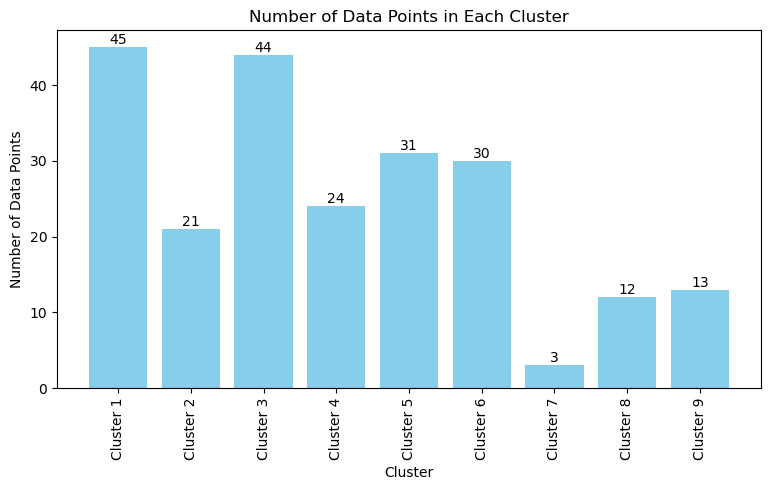

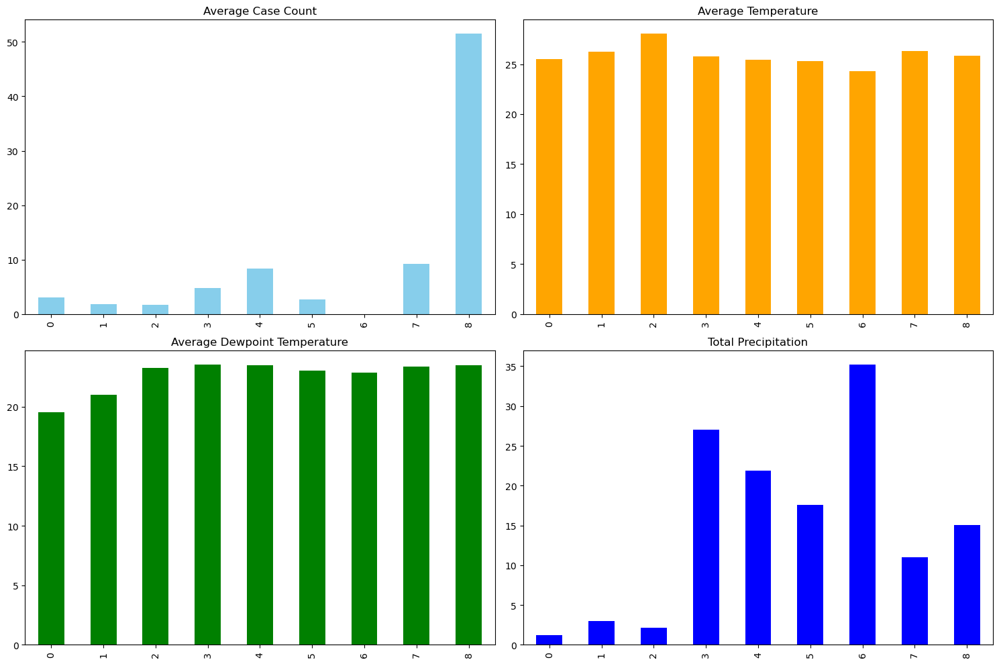

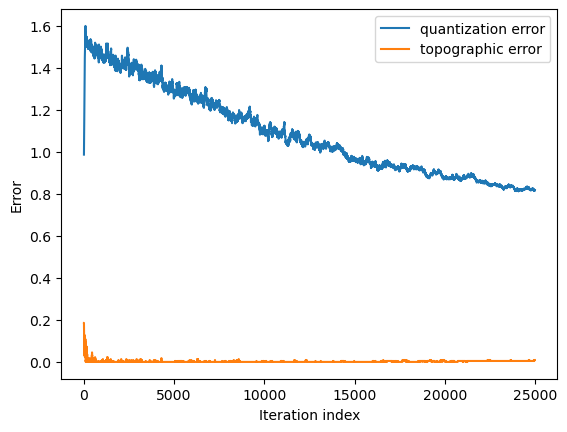

 [ 15052 / 25000 ]  60% - 0:00:00 left 

 [ 25000 / 25000 ] 100% - 0:00:00 left 
 quantization error: 0.8395886180380453


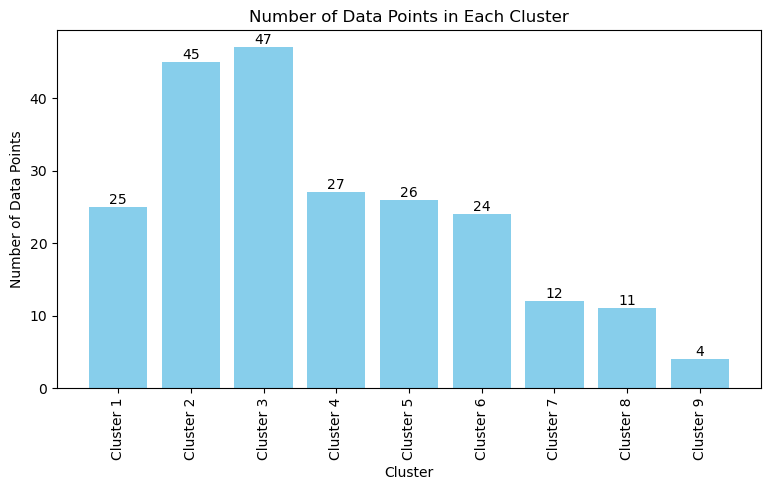

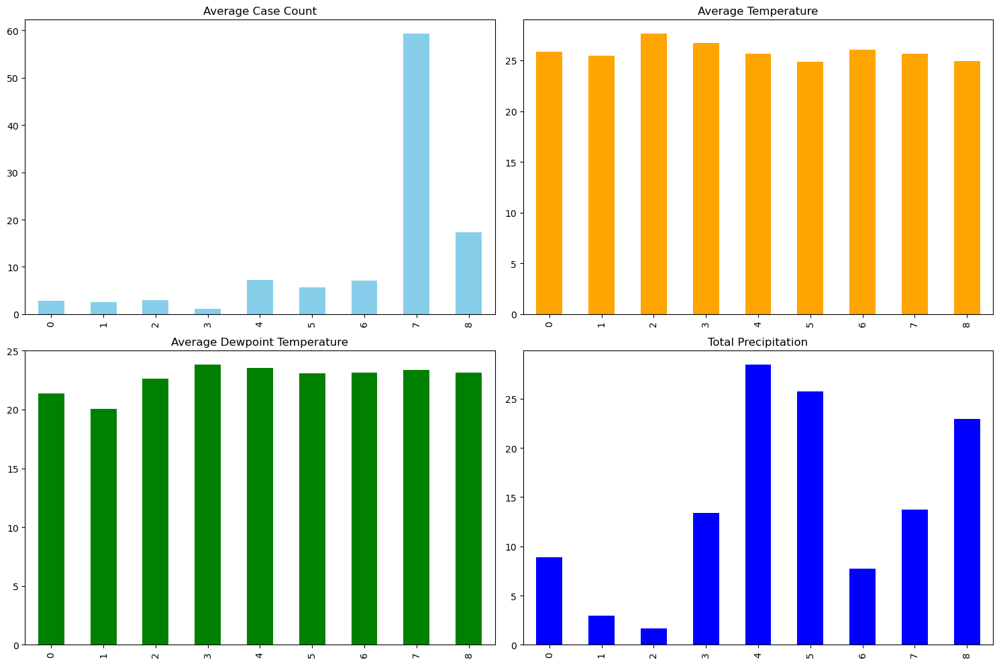

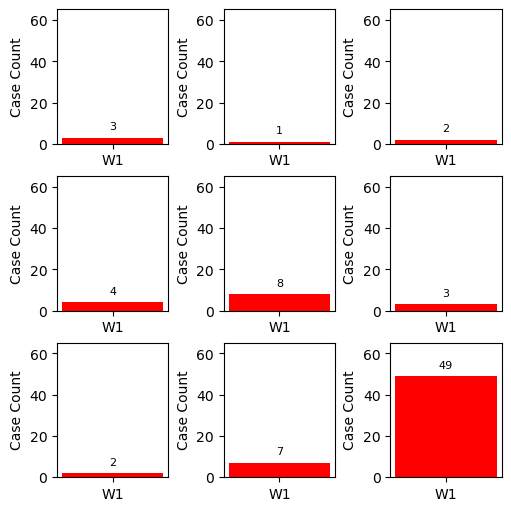

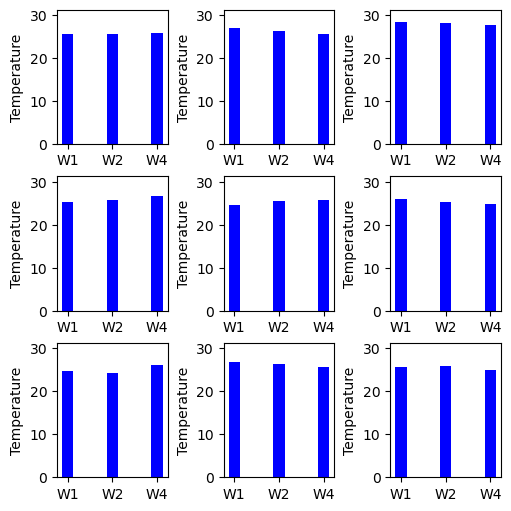

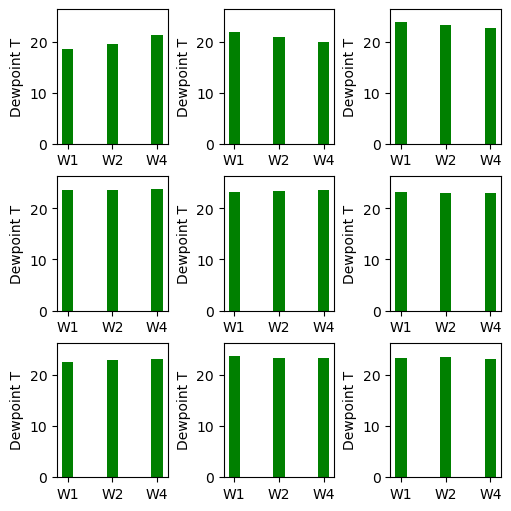

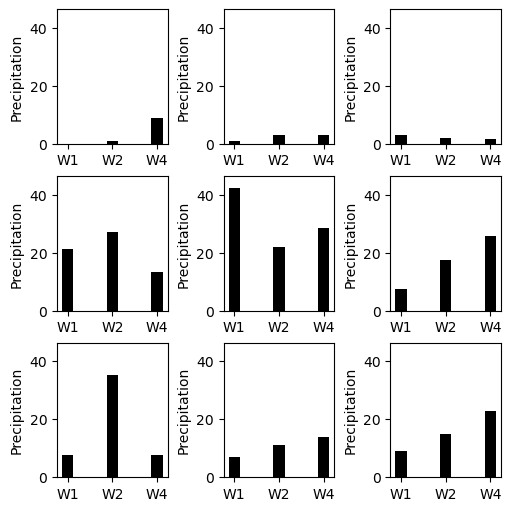

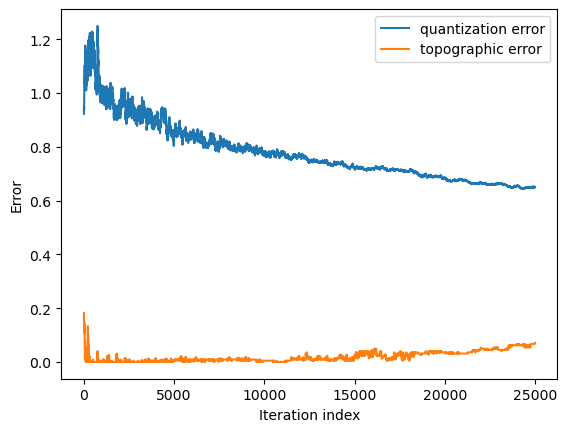

 [ 25000 / 25000 ] 100% - 0:00:00 left 
 quantization error: 0.6629658787007798


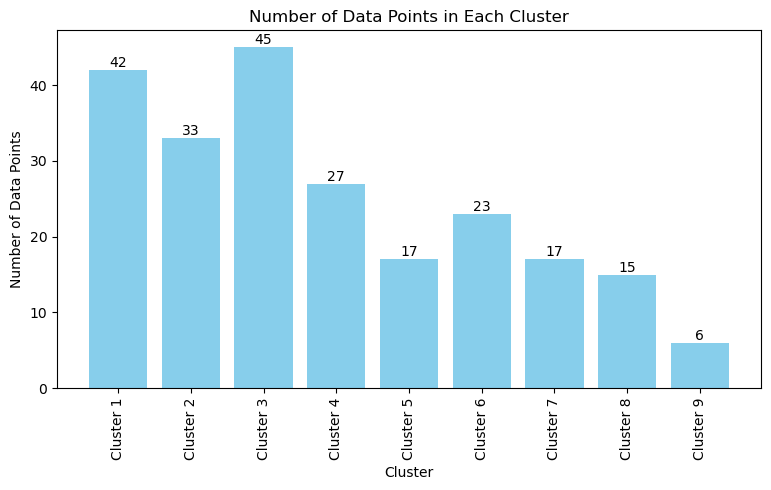

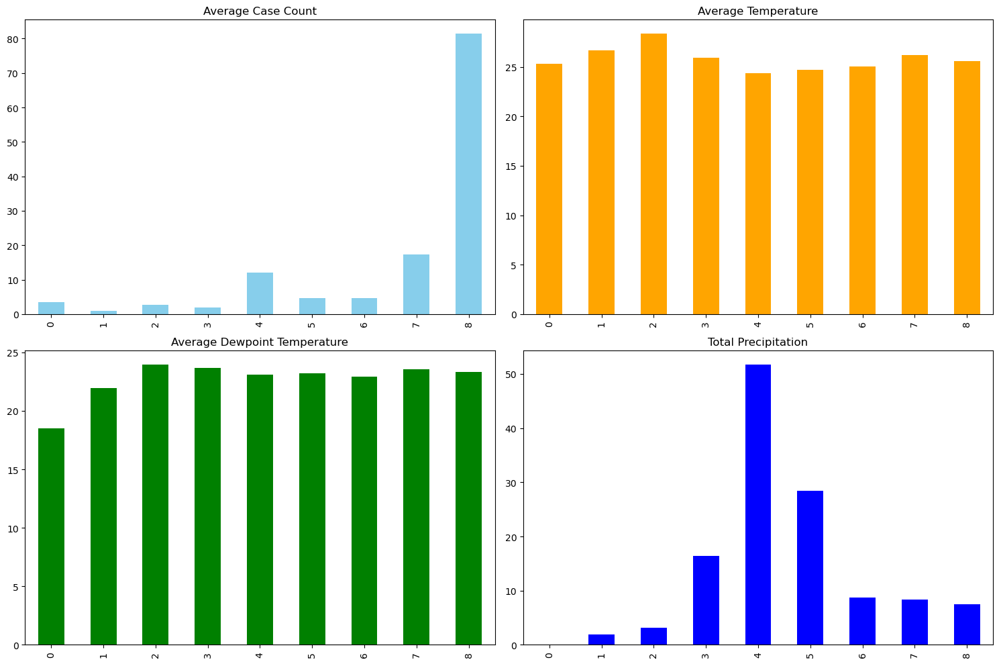

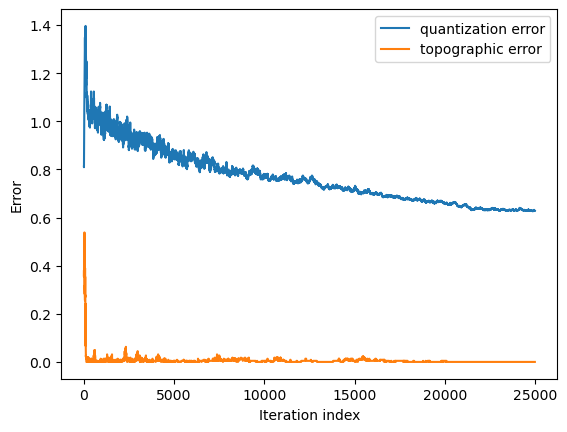

 [ 14088 / 25000 ]  56% - 0:00:00 left 

 [ 25000 / 25000 ] 100% - 0:00:00 left 
 quantization error: 0.6242560069697687


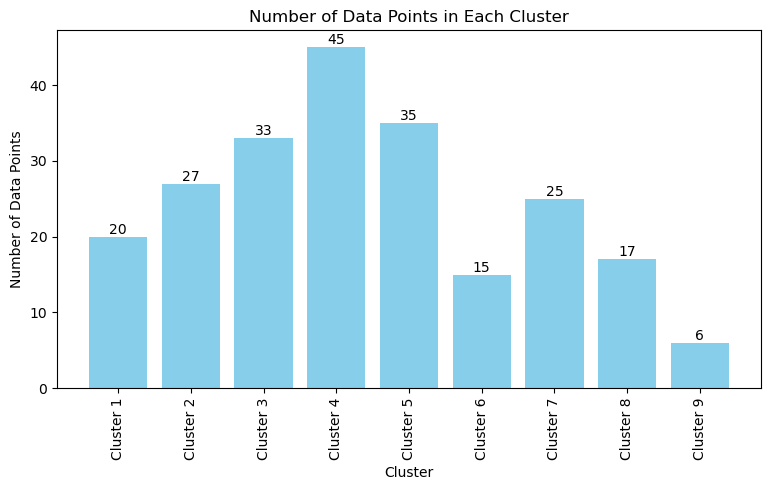

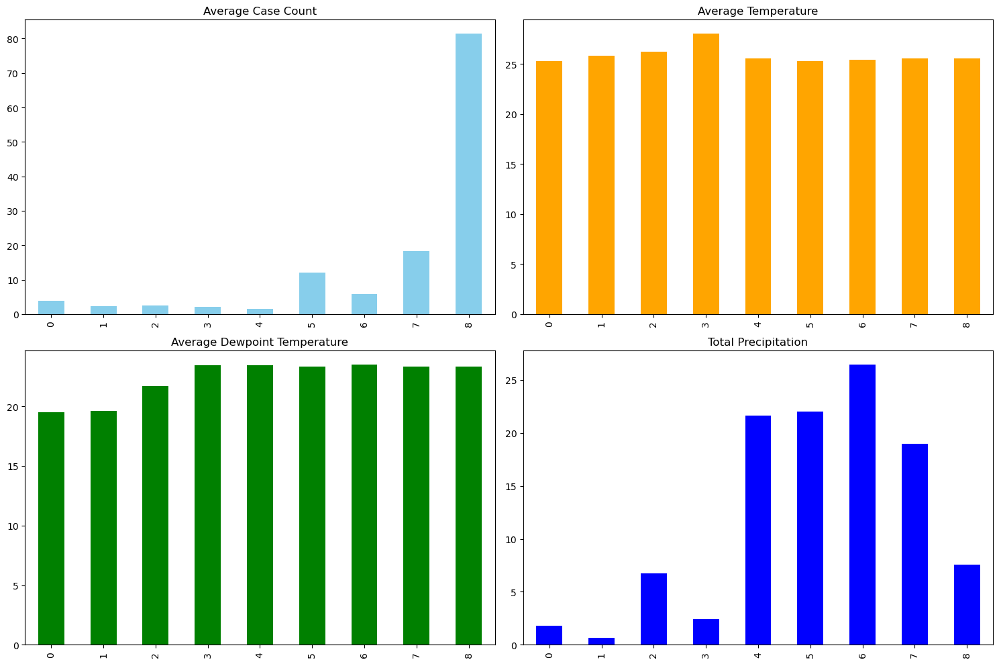

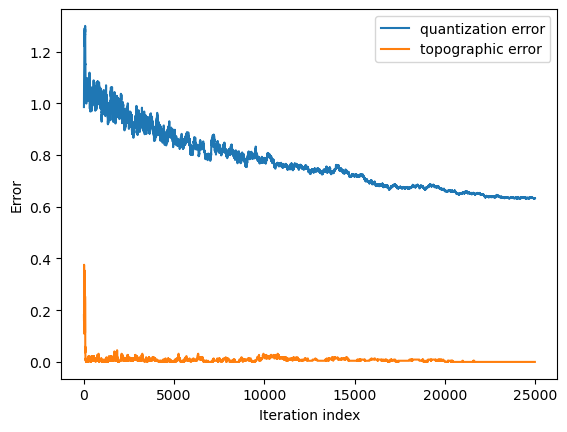

 [ 14085 / 25000 ]  56% - 0:00:00 left 

 [ 25000 / 25000 ] 100% - 0:00:00 left 
 quantization error: 0.6303515132789148


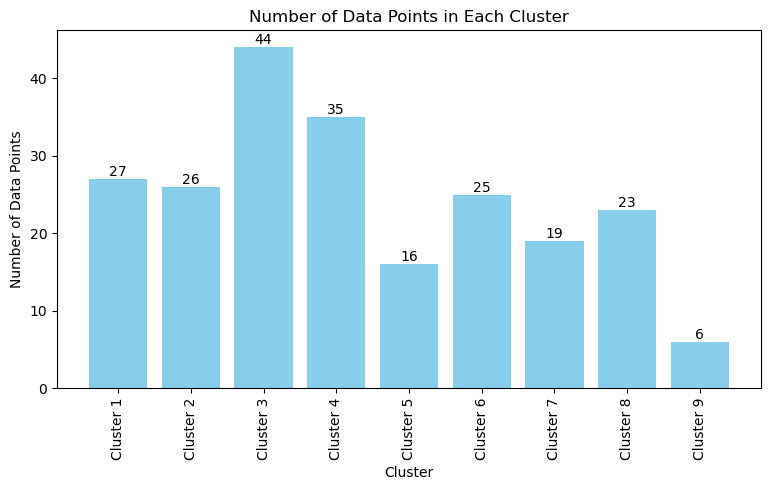

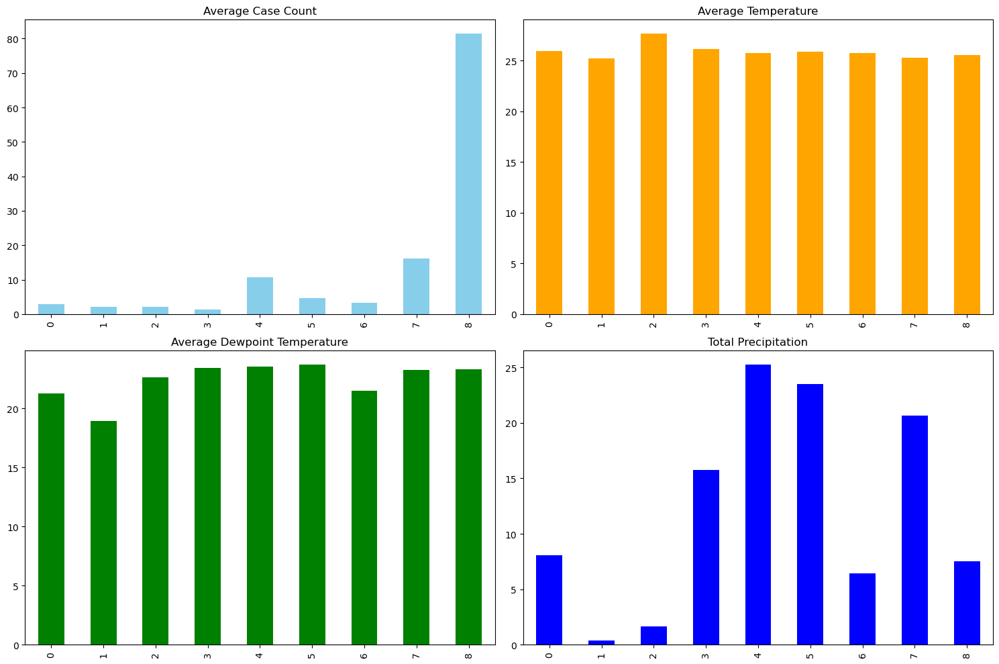

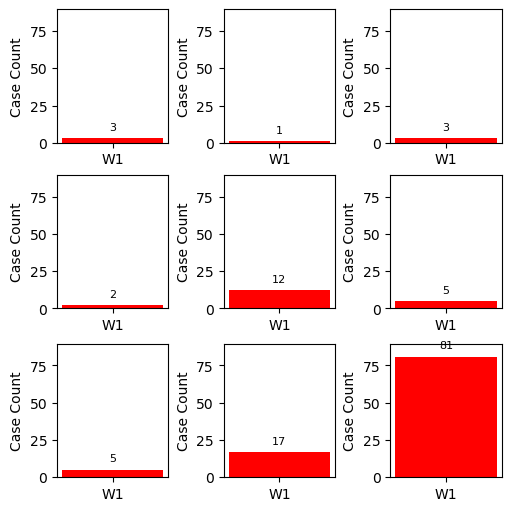

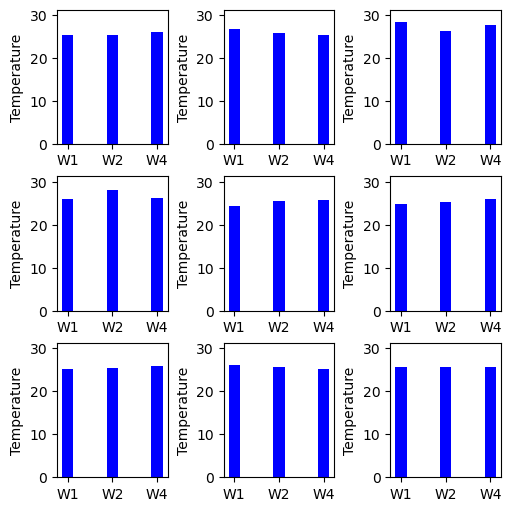

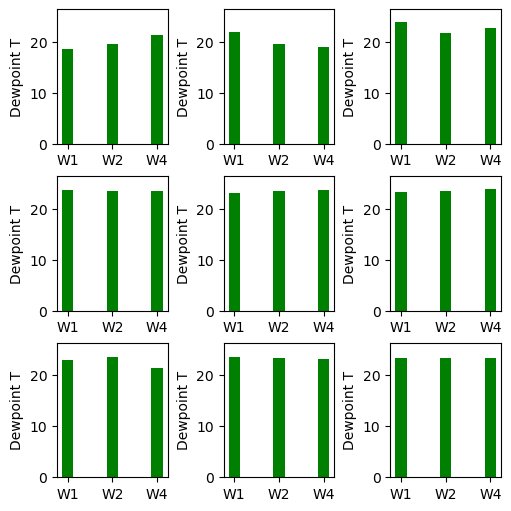

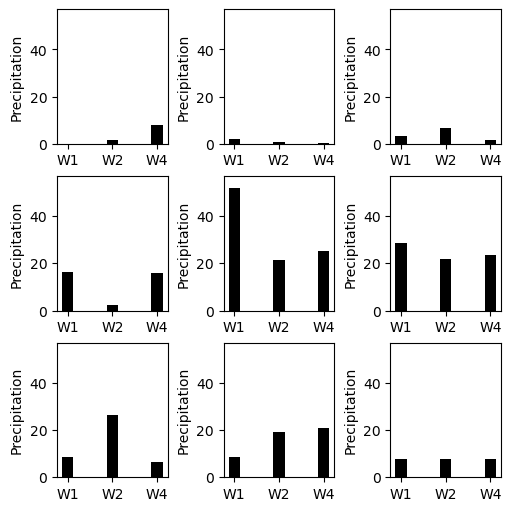

In [10]:
analyzer = SOMAnalyzer("karnataka_dengue_district_level_2017_2023_v1.csv")

# Define hyp (assuming it's defined elsewhere)
hyp = [[5000, 0.2 ,3],
  [5000, 0.2 ,2],
  [15000, 0.1 ,2],
  [25000, 0.05 ,2],
  [25000, 0.1 ,1]] 

# Execute all steps
analyzer.execute_steps(hyp)